## Image Processing

### Canny Edge Detection

In [50]:
def edge_and_cut(img):
    emb_img = img.copy()
    edges = cv2.Canny(img, 100, 200)
    edge_contours = []
    for i in range(edges.shape[0]):
        for j in range(edges.shape[1]):
            if edges[i][j] != 0:
                edge_contours.append((i,j))
    # -------------------------------------
    row_min = edge_contours[np.argsort([contour[0] for contour in edge_contours])[0]][0]
    row_max = edge_contours[np.argsort([contour[0] for contour in edge_contours])[-1]][0]
    # ---
    col_min = edge_contours[np.argsort([contour[1] for contour in edge_contours])[0]][1]
    col_max = edge_contours[np.argsort([contour[1] for contour in edge_contours])[-1]][1]
    # ---
    new_img = img[row_min:row_max, col_min:col_max]
    # -----------------------------------------------
    emb_img[row_min-10:row_min+10, col_min:col_max] = [255,0,0]
    emb_img[row_max-10:row_max+10, col_min:col_max] = [255,0,0]
    # ---
    emb_img[row_min:row_max, col_min-10:col_min+10] = [255,0,0]
    emb_img[row_min:row_max, col_max-10:col_max+10] = [255,0,0]
    # -----------------------------------------------------------
    
    fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(30,20))
    ax[0].imshow(img, cmap = 'gray')
    ax[0].set_title('Original Image', fontsize=24)
    # ---------
    ax[1].imshow(edges, cmap = 'gray')
    ax[1].set_title('Canny Edges', fontsize=24)
    # ---
    ax[2].imshow(emb_img, cmap = 'gray')
    ax[2].set_title('Bounding Box', fontsize=24)
    plt.show()

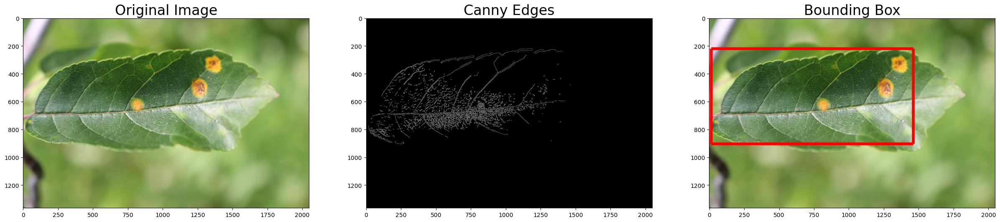

In [51]:
edge_and_cut(train_images[3])

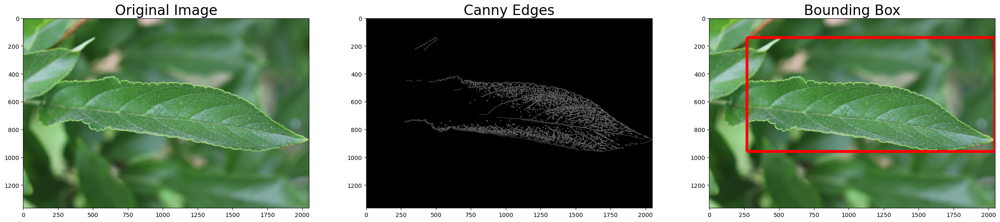

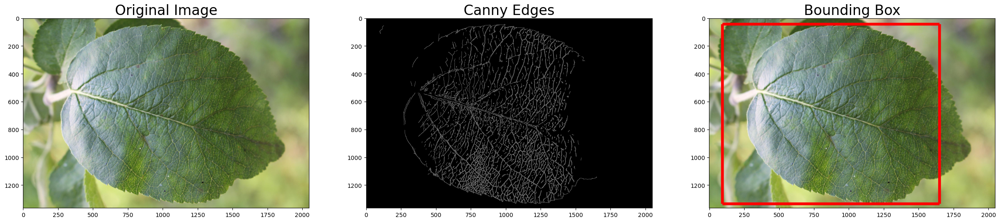

In [52]:
edge_and_cut(train_images[4])
edge_and_cut(train_images[5])

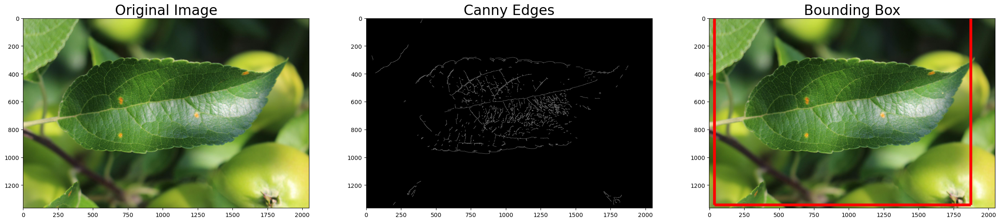

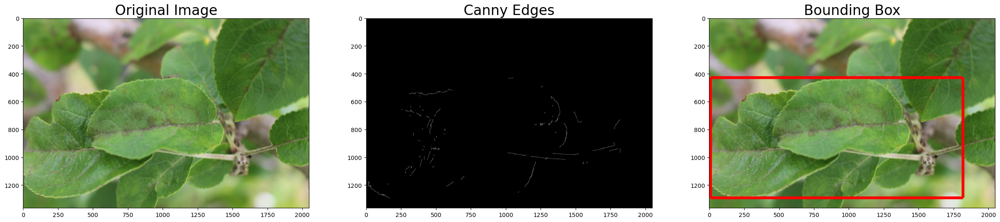

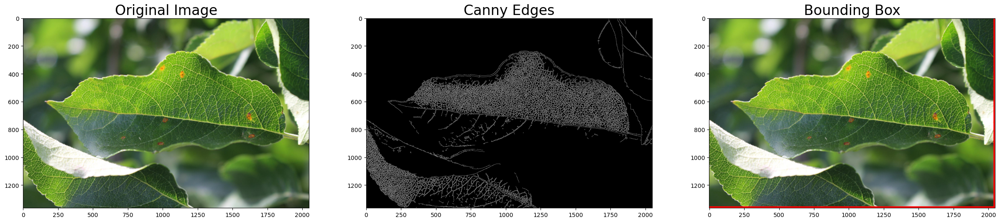

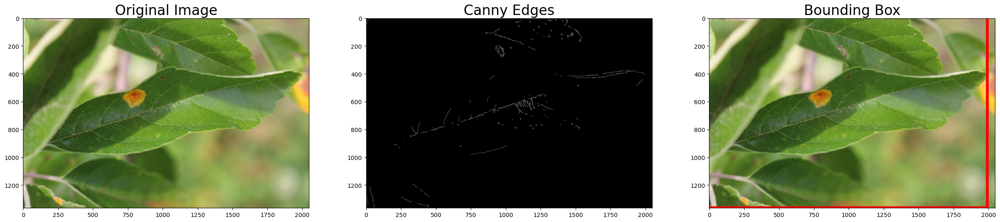

In [53]:
edge_and_cut(train_images[10])
edge_and_cut(train_images[20])
edge_and_cut(train_images[35])
edge_and_cut(train_images[50])

### Flipping

In [54]:
def flip_img(img):
    fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(30,20))
    # ---
    ax[0].imshow(img)
    ax[0].set_title('Original Image', fontsize=24)
    # ---
    ax[1].imshow(cv2.flip(img,0))
    ax[1].set_title('Vertical Flip', fontsize=24)
    # ---
    ax[2].imshow(cv2.flip(img,1))
    ax[2].set_title('Horizontal Flip', fontsize=24)
    # ---
    plt.show()

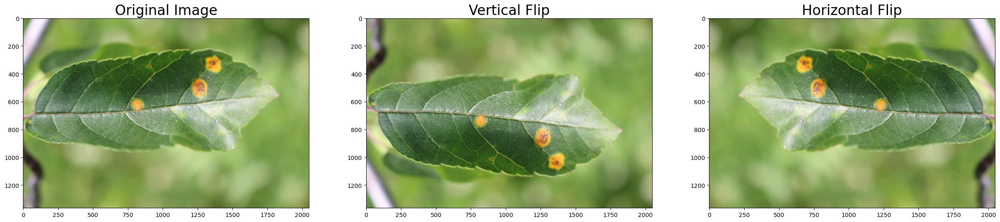

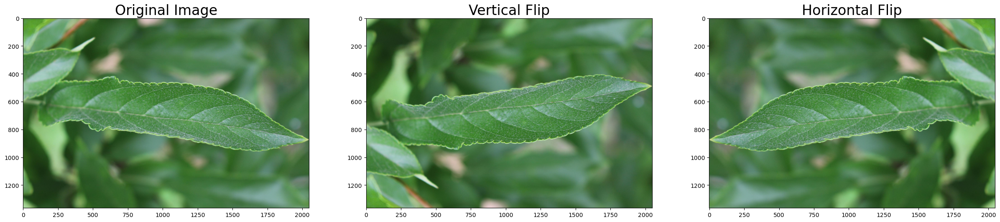

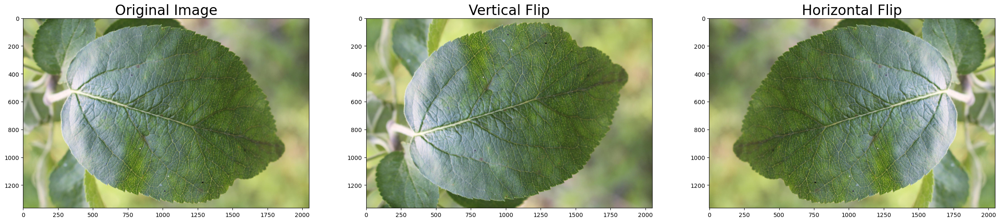

In [55]:
flip_img(train_images[3])
flip_img(train_images[4])
flip_img(train_images[5])

### Convolution

In [56]:
def convolution(img):
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20,20))
    kernel = np.ones((7,7), np.float32)/25
    conv = cv2.filter2D(img, -1, kernel)
    ax[0].imshow(img)
    ax[0].set_title('Original Image', fontsize=24)
    # ---
    ax[1].imshow(img)
    ax[1].set_title('Convolved Image', fontsize=24)
    # ---
    plt.show()

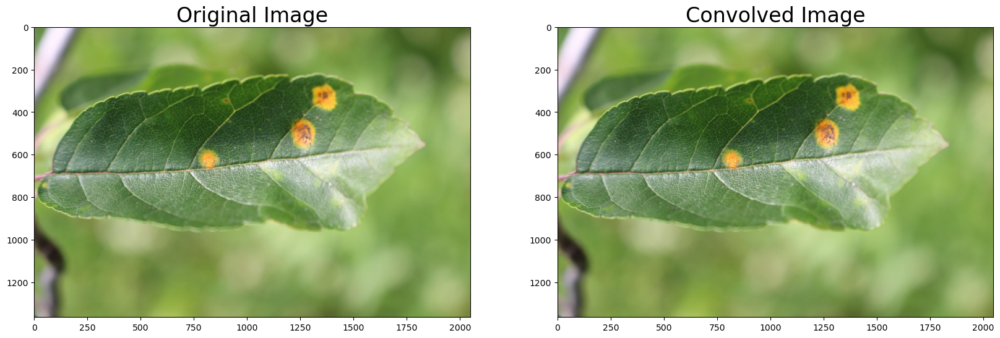

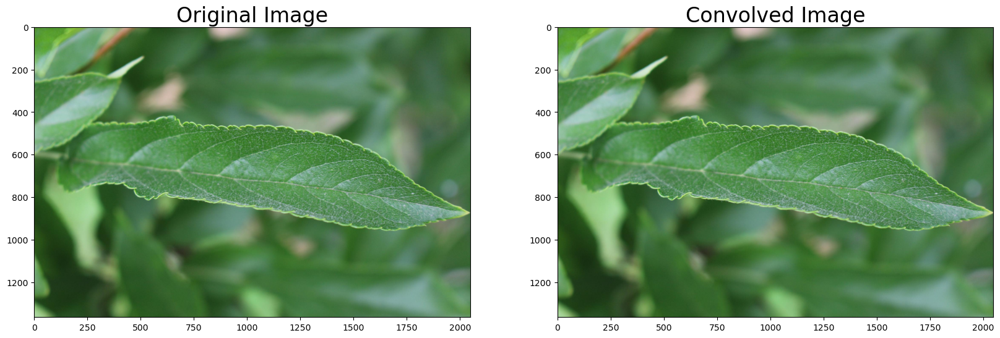

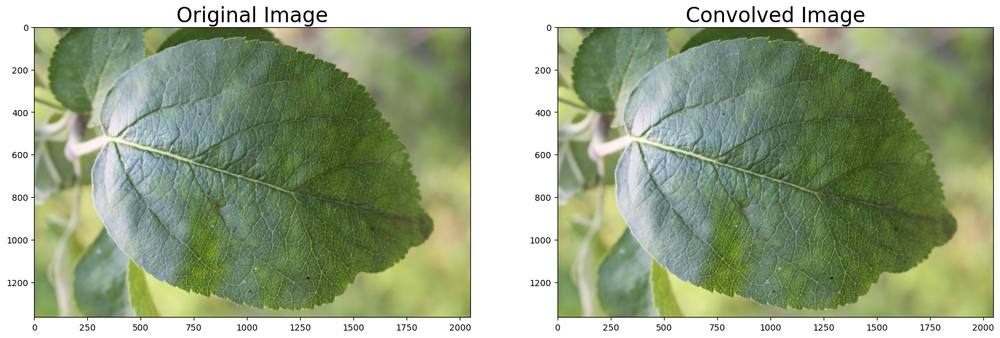

In [57]:
convolution(train_images[3])
convolution(train_images[4])
convolution(train_images[5])

### Blurring

In [58]:
def blur(img):
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20,20))
    ax[0].imshow(img)
    ax[0].set_title('Original Image', fontsize=24)
    # ---
    ax[1].imshow(cv2.blur(img, (100,100)))
    ax[1].set_title('Blurred Image', fontsize=24)
    # ---
    plt.show()

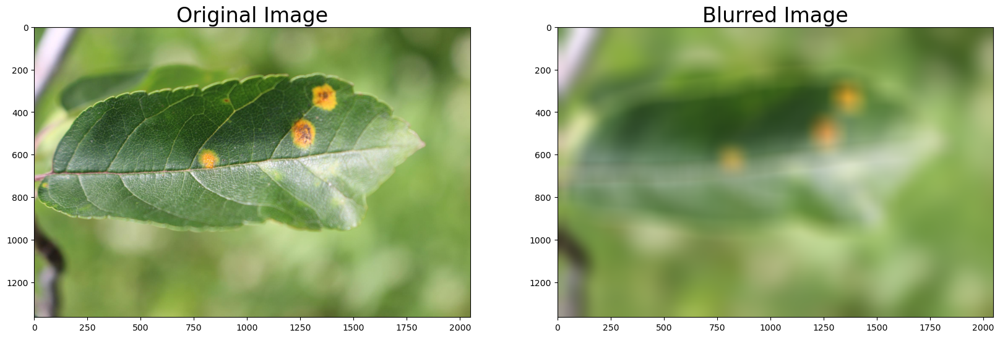

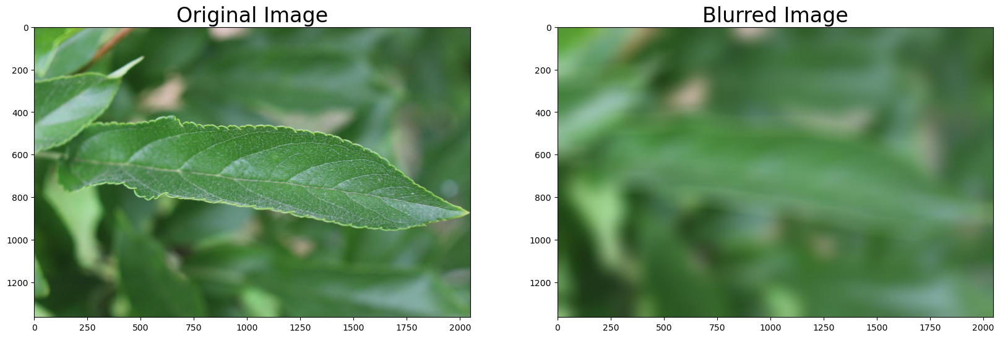

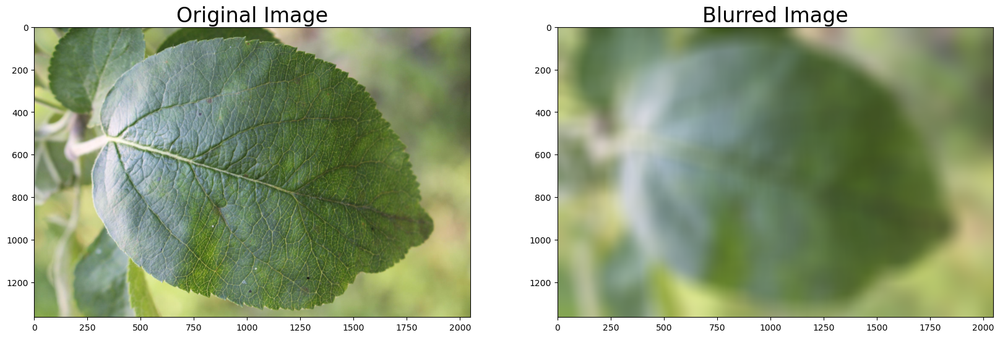

In [59]:
blur(train_images[3])
blur(train_images[4])
blur(train_images[5])

## Modeling

#### Setup TPU Config

In [60]:
#tf.config.list_physical_devices('GPU')

In [61]:
# AUTO = tf.data.experimental.AUTOTUNE
# tpu = tf.distribute.cluster_resolver.TPUClusterResolver()

In [62]:
# # ---
# tf.config.experimental_connect_to_cluster(tpu)
# tf.tpu.experimental.initialize_tpu_system(tpu)
# strategy = tf.distribute.experimental.TPUStrategy(tpu)
# # ------------
# BATCH_SIZE = 16 * strategy.num_replicas_in_sync
# LOCAL_DS_PATH = "C:/Users/Administrator/kaggle/plant-pathology-2020-fgvc7"

In [63]:
# strategy = tf.distribute.get_strategy()
# # ------------
# BATCH_SIZE = 16 * strategy.num_replicas_in_sync
# LOCAL_DS_PATH = "C:/Users/Administrator/kaggle/plant-pathology-2020-fgvc7"

#### Load labels and paths

In [64]:
strategy = tf.distribute.get_strategy()
BATCH_SIZE = 16 * strategy.num_replicas_in_sync
# strategy.num_replicas_in_sync : typically 1, as we are not distributing the training across multiple devices
# -------------------------------------------------
LOCAL_DS_PATH = "C:/Users/Administrator/kaggle/plant-pathology-2020-fgvc7"

In [65]:
def format_path(st):
    return LOCAL_DS_PATH + '/images/' + st + '.jpg'

In [66]:
train_paths = train_data.image_id.apply(format_path).values
test_paths = test_data.image_id.apply(format_path).values
# ---------------
train_labels = np.float32(train_data.loc[:, 'healthy':'scab'].values)
train_paths, valid_paths, train_labels, valid_labels = train_test_split(train_paths,train_labels, test_size=0.15, random_state=2024)

In [67]:
def decode_image(filename, label=None, image_size=(512,512)):
    bits = tf.io.read_file(filename)
    image = tf.image.decode_jpeg(bits, channels=3)
    image = tf.cast(image, tf.float32) / 255.0
    image = tf.image.resize(image, image_size)
    # ---
    if label is None:
        return image
    else:
        return image, label
# --------------------------------------------------------------
def data_augment(image, label=None):
    image = tf.image.random_flip_left_right(image)
    image = tf.image.random_flip_up_down(image)
    
    if label is None:
        return image
    else:
        return image, label

In [68]:
# BATCH_SIZE = 32
# ------------
train_dataset = (
    tf.data.Dataset.from_tensor_slices((train_paths, train_labels))
    .map(decode_image, num_parallel_calls=tf.data.AUTOTUNE).repeat()
    .shuffle(512).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
)
# ------------------
valid_dataset = (
    tf.data.Dataset.from_tensor_slices((valid_paths,valid_labels))
    .map(decode_image, num_parallel_calls=tf.data.AUTOTUNE)
    .batch(BATCH_SIZE).cache().prefetch(tf.data.AUTOTUNE)
)
# ------------------
test_dataset = (
    tf.data.Dataset.from_tensor_slices(test_paths)
    .map(decode_image, num_parallel_calls=tf.data.AUTOTUNE)
    .batch(BATCH_SIZE)
)
# -----------------------------------------------------------

#### The Helper function

In [69]:
def build_lrfn(lr_start=0.00001, lr_max=0.00005, lr_min=0.00001, lr_rampup_epochs=5, lr_sustain_epochs=0, lr_exp_decay=.8):
    lr_max = lr_max * strategy.num_replicas_in_sync
    def lrfn(epoch):
        if epoch < lr_rampup_epochs:
            lr = (lr_max - lr_start) / lr_rampup_epochs * epoch + lr_start
        elif epoch < lr_rampup_epochs + lr_sustain_epochs:
            lr = lr_max
        else:
            lr = (lr_max - lr_min) * lr_exp_decay ** (epoch - lr_rampup_epochs - lr_sustain_epochs) + lr_min
        return lr
    return lrfn

In [70]:
lrfn = build_lrfn()
STEPS_PER_EPOCH = train_labels.shape[0] // BATCH_SIZE
lr_schedule = tf.keras.callbacks.LearningRateScheduler(lrfn, verbose = 1)